# Project summary


The project summary gives on overall view of the methods and the development process for the finalised model. Additionally, the summary entails the intermediate steps of the progress toward final accuracy. 

## Data analysis
The dataset was explored to get a better overall undertanding of the data that was used for analysis.

Hence, multiple problems from the dataset were outlined accordingly, that could pose a negative effect for the future model performance:

1. Some images that don't contain insects. (section 3.2)
2. Some images between one class represent different insects. (section 3.2)
3. Some images are repeated. (section 3.2)

Subsequently, the distribution of images per class which showed a highly unbalanced dataset (section 3.3.1) and in the light of these results, different techniques were applied to solve the issue:

*   Implementation of splitting the dataset (0.9 training, 0.1 validation). After testing the model, there weren't significant changes in final the performance.

*   The application of different balancing techniques to solve the matter:

  *   1) Attempt was to oversample the classes with less number of images and 
at the same time undersampling the few classes with a high number of images. Hence, in order to avoid overfitting different data augmentation techniques were applied to the oversampling images. Finally, this method was deemed implausible since it overfits the model.

  *   2) Attempt of balancing the dataset was through using [WeightedRandomSampler](https://pytorch.org/docs/stable/data.htmin the dataloader. In order to accomplish it, a weight was assigned for each class. The dataloader would use samples of the classes with higher weights (the classes with less images). After testing this method, it was discarded since it gave worse results in terms of validation accuracy.

## Why was the balancing technique unsuccesful with the model?

The test set was also unbalanced. It followed the same distribution as the training and validation sets, meaning there is a large dispersion between the number of images of different classes. (Section 6.2)

Therefore, the overall accuracy is greater when using an unbalanced dataset since the most tested classes are the ones that the network had trained the most.

Subsequently, the unbalanced models that were tested presented a higher overall accuracy than the balanced models suggesting that the test set used in Kaggle follows the same distribution pattern as the dataset used during training.

## Data pre-processing

Data pre-processing was applied to some data refining over the dataset images as it can be seen in the data transformers (Section 4.2). The changes over the images are the following:

*   Resize of images to 224x224 to suit the Resnet/Resnext model input
*   Application of data augmentation techniques on the images to increase the variety of images. Many different  combinations of augmentations were tried and only "RandomHorizontalFlip" was kept, since it yielded the best results.
* Image to tensor
* Normalise the images such that all the features would be on the same scale which speeds up the training phase.


## Model choice and hyperparameters
To reach a higher accuracy, the ensemble learning technique was applied with two models. The two models used for this technique were Resnet152 and Resnext101 architectures. 

Resnet152 and Resnext101 architectures offer great performance on multiclass image classification with deep convulational layers, which would allow the training of the model in shorter time durations (approximately 1 hour). Both models have low top-5 errors in the learning rate, which make both architectures efficient.    

It's worth mentioning, by using more models with the ensemble learning technique the overall accuracy could be even higher. Also, two models were chosen in order to save GPU time. All in all, the sum of the two probability vectors have the higher value of the overall combined vector. Thus, the model improved by 2,7% with the ensemble learning technique by combining Resnet152 and Resnext101. 

Below are the model hyperparameters that were refined after various iterations:


Hyperparameters for Resnet152:
- Criterion: Cross Entropy Loss 

- Optimizer: Stochastic Gradient Descent (Learning rate: 0.001 & Momentum: 0.9)

- Epochs: 5

- Batch size: 32
 
for Resnext101:
- Criterion: Cross Entropy Loss 

- Optimizer: Stochastic Gradient Descent (Learning rate: 0.001 & Momentum: 0.9)

- Epochs: 10

- Scheduler: step 4 / gamma 0.1

- Batch size: 32

# 1 - Import libraries and files path initialization


## 1.1 - Kaggle

In [1]:
from __future__ import print_function, division
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torchvision
import torch.optim as optim
import seaborn as sns
import sklearn.metrics
from torch.optim import lr_scheduler
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler, random_split
from torchvision import transforms, utils, models
from tqdm import tqdm
from IPython.display import Image as Img
from IPython.display import display
from PIL import Image
import matplotlib.pyplot as plt
import time
from time import sleep
import os

from IPython.display import display

In [2]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/resnext-101/model.pt
/kaggle/input/polytech-ds-2020/classes.txt
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/sample_submission.csv
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/val.txt
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/train.txt
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/64601.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/31973.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/30778.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/08450.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/19812.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/22735.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/38246.jpg
/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polyt

In [3]:
TRAIN_IMG_PATH = "/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/"
TEST_IMG_PATH = "/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/test_images/"
LABELS_TXT_PATH = "/kaggle/input/polytech-ds-2020/classes.txt"
SAMPLE_SUB_PATH = "/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/sample_submission.csv"
TRAINING_LABELS_PATH = "/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/train.txt"
VAL_LABELS_PATH =  "/kaggle/input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/val.txt"

# 2 - Definition of Dataset and functions

## 2.1 - Definition of own Dataset

In [4]:
class InsectDataset(Dataset):

    def __init__(self, img_dir, dataframe, transform=None):
        self.labels_frame = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.labels_frame)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.labels_frame.id[idx])
        image = Image.open(img_name).convert('RGB')
        label = self.labels_frame.target[idx]
        
        if self.transform:
          image = self.transform(image)
          
        return [image, label] 

## 2.2 - Definition of functions

### 2.2.1 - Plotting/Displaying functions

We define the following 4 functions that we will later use to display de different distributions (Images per class, per size, per class and up to 5 batches, and to display the tensors)

In [5]:
def plot_image_distribution(dataframe):
  count_df = dataframe['target'].value_counts().to_frame()
  count_df['id'] = count_df.index
  count_df.rename(columns={'target':'count'}, inplace=True)

  dims = (22, 10)
  fig, ax = plt.subplots(figsize=dims)

  # seaborn histogram
  sns.barplot(data=count_df, x='id', y='count', ax=ax)
  sns.color_palette("pastel")
  # Add labels
  plt.title('Distribution of images per class',fontweight='bold', fontsize=16)
  plt.xlabel('Class',fontweight='bold', fontsize=12)
  plt.xticks(rotation=90)
  plt.ylabel('Number of images', fontweight='bold', fontsize=12)

In [6]:
def image_size_distribution(dataframe):
  shapes = []
  for index, row in dataframe.iterrows():
    img_name = os.path.join(TRAIN_IMG_PATH, row['id'])
    image = Image.open(img_name)
    shapes.append(image.size)

  df_shapes = pd.DataFrame({'Shapes': shapes})
  counts = df_shapes['Shapes'].value_counts()

  plt.figure(figsize=(14, 10))
  sns.barplot(x=counts.head(15).index, y=counts.head(15).values)

  plt.title('Distribution of images per size',fontweight='bold', fontsize=16)
  plt.xlabel('Size',fontweight='bold', fontsize=12)
  plt.xticks(rotation=90)
  plt.ylabel('Number of images', fontweight='bold', fontsize=12)

  return counts

In [7]:
def plot_distrib_in_n_batches(batches=5):
  df = pd.DataFrame()
  labels = []

  for i in range(batches):
    img, label = next(iter(train_loader))
    for i in range(31):
      labels.append(label[i].item())

  df["count"] = labels

  count_df = df["count"].value_counts().to_frame()
  count_df['id'] = count_df.index

  dims = (22, 10)
  fig, ax = plt.subplots(figsize=dims)

  # seaborn histogram
  sns.barplot(data=count_df, x='id', y='count', ax=ax)
  sns.color_palette("pastel")
  # Add labels
  plt.title('Distribution of images per class',fontweight='bold', fontsize=16)
  plt.xlabel('Class',fontweight='bold', fontsize=12)
  plt.xticks(rotation=90)
  plt.ylabel('Number of images', fontweight='bold', fontsize=12)

In [8]:
# a little helper function do directly display a Tensor
def display_tensor(t):
  trans = transforms.ToPILImage()
  display(trans(t))

### 2.2.2 - Computing weights of each class

In [9]:
def get_weights(dataframe, num_classes):
    #Counting number of images per class                        
    count = [0] * num_classes                                                      
    for idx, row in dataframe.iterrows():     
      count[row['target']] += 1

    #Computing weight of each class
    weight_per_class = [0.] * num_classes                                      
    N = float(sum(count))                                                   
    for i in range(num_classes):                                                   
      weight_per_class[i] = N/float(count[i])

    #Assigning weight to each image                                     
    weight = [0] * len(dataframe)                                              
    for idx, row in dataframe.iterrows():     
      weight[idx] = weight_per_class[row['target']]

    return weight

### 2.2.3 - Training function

In [10]:
def train_model(model, criterion, optimizer, num_epochs=25):
    since = time.time()

    best_model_wts = model.state_dict()
    best_acc = 0.0
    all_epoch_loss, all_epoch_acc, all_epoch_val_loss, all_epoch_val_acc = [], [], [], []

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:     
            since_epoch = time.time()
            if phase == 'train':
                model.train(True)  # Set model to training mode
            else:
                model.train(False)  # Set model to evaluate mode
    
            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for data in tqdm(dataloaders[phase]):
                # get the inputs
                inputs, labels = data

                inputs = Variable(inputs.type(Tensor))
                labels = Variable(labels.type(LongTensor))

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                outputs = model(inputs)
                _, preds = torch.max(outputs.data, 1)
                loss = criterion(outputs, labels)

                # backward + optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()
                    
                # statistics
                running_loss += loss.data
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = torch.true_divide(running_loss,len(datasets[phase]))
            epoch_acc = torch.true_divide(running_corrects,len(datasets[phase]))

            time_elapsed_epoch = time.time() - since_epoch
            print('{} Loss: {:.4f} Acc: {:.4f} in {:.0f}m {:.0f}s'.format(
                phase, epoch_loss, epoch_acc, time_elapsed_epoch // 60, time_elapsed_epoch % 60))
            
            if phase == 'train':
                all_epoch_loss.append(epoch_loss)
                all_epoch_acc.append(epoch_acc)
            else:
                all_epoch_val_loss.append(epoch_loss)
                all_epoch_val_acc.append(epoch_acc)
            
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    #Plotting accuracy/loss curves
    x = np.arange(num_epochs)
    plt.figure()
    plt.plot(x, all_epoch_acc, label="training")
    plt.plot(x, all_epoch_val_acc, label="validation")
    plt.title('Accuracy curve',fontweight='bold', fontsize=12)
    plt.legend()

    plt.figure()
    plt.plot(x, all_epoch_loss, label="training")
    plt.plot(x, all_epoch_val_loss, label="validation")
    plt.title('Loss curve',fontweight='bold', fontsize=12)
    plt.legend()

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [11]:
def show_combined_val_accuracy(model,model2):
  model.eval()
  model2.eval()
  running_val_accuracy = 0 
  for i, batch in enumerate(tqdm(val_loader)):
          with torch.no_grad():
              x = batch[0]
              labels = batch[1]
              x = x.cuda()
              labels = labels.cuda()
              
              y1 = model(x)
              y2 = model2(x)
              y = y1 + y2
              if int(y.max(1)[1]) == int(labels):
                running_val_accuracy += 1
  print(running_val_accuracy / len(val_ds))

### 2.2.4 - Testing function

In [12]:
def test_model(model,model2):
    since = time.time()

    if torch.cuda.is_available():
        model.cuda()
        model2.cuda()
    model.eval()
    model2.eval()
    preds = []
    
    for i, (inputs,targets) in tqdm(enumerate(sub_loader)):
        if torch.cuda.is_available():
            inputs = inputs.cuda()
            pred1 = model(inputs).data.cuda().cpu().numpy().copy()
            pred2 = model2(inputs).data.cuda().cpu().numpy().copy()
            pred = pred1+pred2
        else:
            pred1 = model(inputs).data.numpy().copy()
            pred2 = model2(inputs).data.numpy().copy()
            pred = pred1+pred2
        preds.append(pred)
            
    time_elapsed = time.time() - since
    print('Run complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
    
    return np.concatenate(preds)

### 2.2.5 - Confusion Matrix function

In [13]:
def get_confusion_matrix(model, dataloader):
    since = time.time()

    if torch.cuda.is_available():
        model.cuda()
    model.eval()
    preds = []
    trues = []

    for i, (inputs,targets) in tqdm(enumerate(dataloader)):
        if torch.cuda.is_available():
            inputs = inputs.cuda()
            pred = model(inputs).data.cuda().cpu().numpy().copy()
        else:
            pred = model(inputs).data.numpy().copy()
            
        preds.append(pred)
        trues.append(targets)
            
    time_elapsed = time.time() - since
    print('Run complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
    
    y_pred = np.concatenate(preds).argmax(1)
    y_true = np.concatenate(trues)
    
    cf_matrix = sklearn.metrics.confusion_matrix(y_true,y_pred)
    
    return cf_matrix

# 3 - Data exploration

## 3.1 - Creation of training and validation dataframes

In [14]:
training_df = pd.read_csv(TRAINING_LABELS_PATH, sep=" ", header=None)
training_df.columns = ["id", "target"]
training_df

,id,target
0,00002.jpg,0
1,00003.jpg,0
2,00005.jpg,0
3,00006.jpg,0
4,00008.jpg,0
...,...,...
45090,75212.jpg,101
45091,75214.jpg,101
45092,75216.jpg,101
45093,75217.jpg,101


In [15]:
val_df = pd.read_csv(VAL_LABELS_PATH, sep=" ", header=None)
val_df.columns = ["id", "target"]
val_df

,id,target
0,00009.jpg,0
1,00012.jpg,0
2,00014.jpg,0
3,00034.jpg,0
4,00035.jpg,0
...,...,...
7503,75187.jpg,101
7504,75191.jpg,101
7505,75202.jpg,101
7506,75206.jpg,101


## 3.2 - Visualizing content of dataset

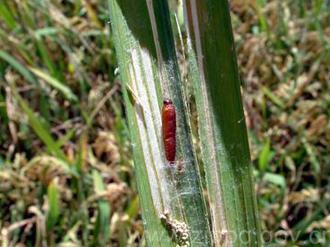

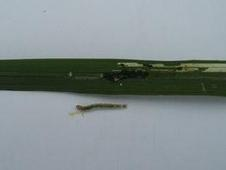

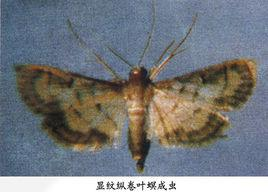

In [16]:
imgs=[Img(filename=TRAIN_IMG_PATH+'0000{}.jpg'.format((i+1)*3)) for i in range(3)]
display(*imgs)

After exploring the dataset we found various aspects that will negatively affect the performance:





1.   There are images which **does not contain insects**



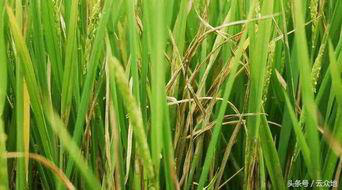

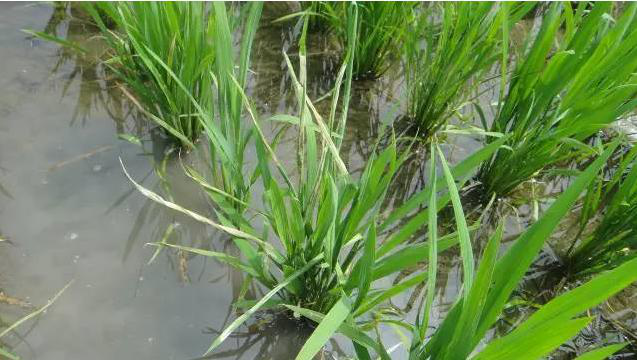

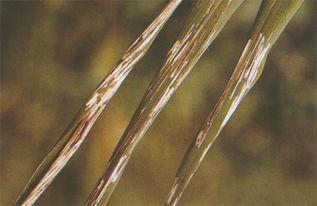

In [17]:
img=[Image.open(TRAIN_IMG_PATH+"00002.jpg"), Image.open(TRAIN_IMG_PATH+"00018.jpg"), Image.open(TRAIN_IMG_PATH+"00021.jpg")]
display(*img)

2.   Some images between one class represent **different insects**. Below one can find the 1st 4 images of the class 70:

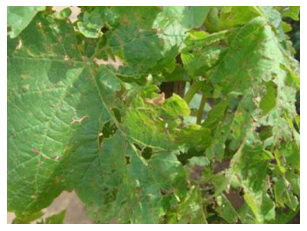

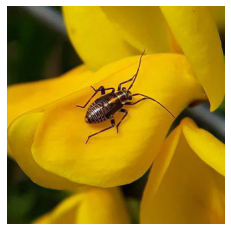

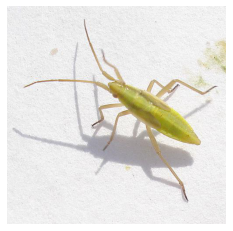

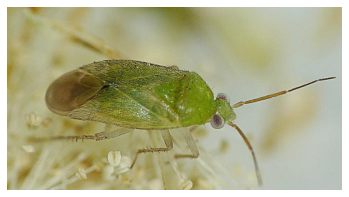

<Figure size 432x288 with 0 Axes>

In [18]:
df_70 = training_df.loc[training_df['target'] == 70]
for index, row in df_70[:4].iterrows():
    im = Image.open(TRAIN_IMG_PATH+row['id'])
    plt.imshow(im)
    plt.axis('off')
    plt.show()
    plt.clf() 
    im.close()
    sleep(2)

3.   Some images are **repeated**

In [19]:
img=[Image.open(TRAIN_IMG_PATH+"00033.jpg"), Image.open(TRAIN_IMG_PATH+"00042.jpg")]



## 3.3 - Exploring dataset distribution




### 3.3.1 - Distribution of images per class

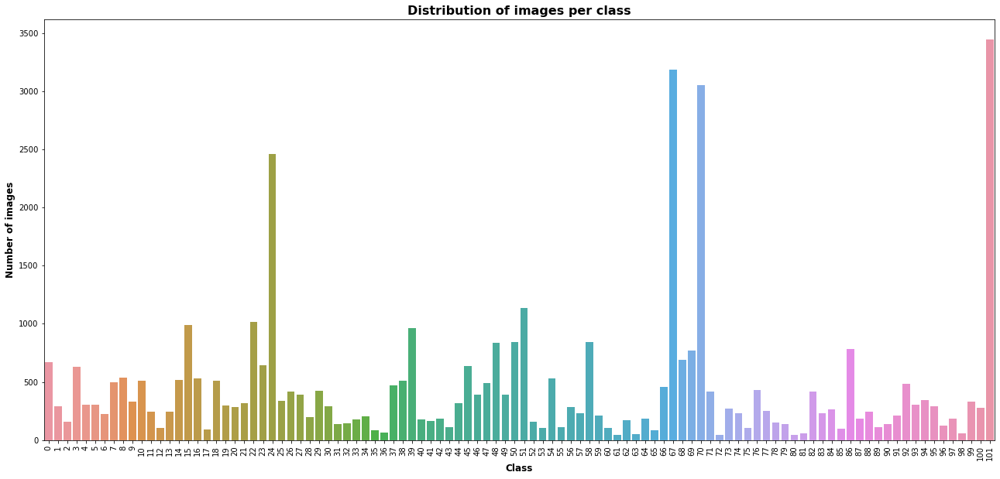

In [20]:
plot_image_distribution(training_df)

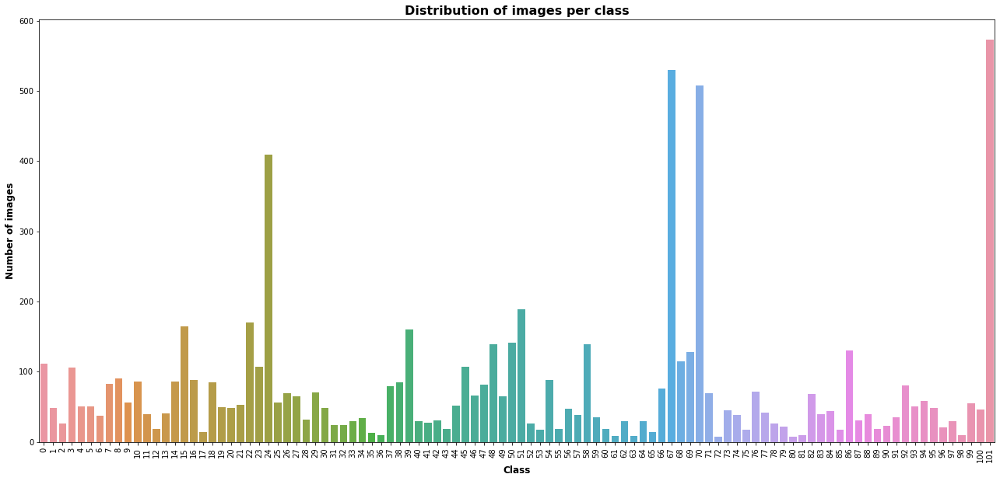

In [21]:
plot_image_distribution(val_df)

As we can see in the previous figures the Dataset is unbalanced since in the training dataset we can find **classes with more than 3000 samples** (i.e. class 70) and **classes with less than 50 samples** (i.e. class 61)

In [22]:
count_df = training_df['target'].value_counts().to_frame()
count_df['id'] = count_df.index
count_df.rename(columns={'target':'count'}, inplace=True)
mean = count_df['count'].mean()
print("Mean of number of images per class:", mean)


Mean of number of images per class: 442.1078431372549


As it can be observed, **the mean of the number of images per class is less than 450** since most of the classes contain less than 200 images. For a good training dataset we should have around 2000 of images per class.

### 3.3.2 - Distribution of images per size

In [23]:
# image_size_distribution(training_df)

Furthermore, we can observe that the images sizes are very heterogeneus which might imply some problems when resizing and croping images

# 4 - Data pre-processing

## 4.1 - Creating sampler to balance dataset

This samplers were used for applying balancing techniques on the dataset, but they are not used in the final model.

In [24]:
#num_classes = 102
#weights = get_weights(training_df,num_classes)
#weights = torch.DoubleTensor(weights)
# train_sampler = WeightedRandomSampler(weights, len(weights), replacement = True)                     

In [25]:
#num_classes = 102
#weights = get_weights(val_df,num_classes)
#weights = torch.DoubleTensor(weights)
# val_sampler = WeightedRandomSampler(weights, len(weights), replacement = True)

## 4.2 - Definition of transformers

In [26]:
augm_transform = transforms.Compose([
        transforms.Resize((224,224)),       
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

simple_transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

transform = {"augm": augm_transform, "simple": simple_transform}


## 4.3 - Definition of datasets

In [27]:
 train_ds = InsectDataset(TRAIN_IMG_PATH, training_df, augm_transform)
 val_ds = InsectDataset(TRAIN_IMG_PATH, val_df, augm_transform)

 datasets = {"train": train_ds, "val": val_ds}

In [28]:
print("Number of images in training dataset:", len(train_ds))
print("Number of images in validation dataset:", len(val_ds))

Number of images in training dataset: 45095
Number of images in validation dataset: 7508


### 4.3.1 - Checking transformed images

Let's check how the transformations apply on our data.

In [29]:
print("Shape of image is: ", train_ds[6][0].shape)

Shape of image is:  torch.Size([3, 224, 224])


Original image

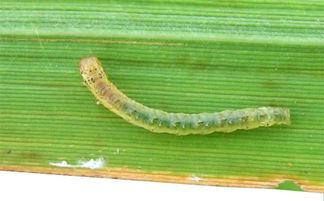

In [30]:
img15 = Img(filename=TRAIN_IMG_PATH+'00015.jpg')
display(img15)

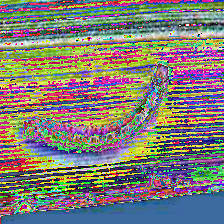

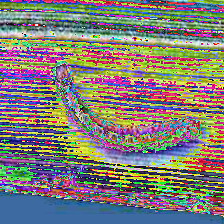

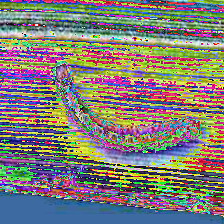

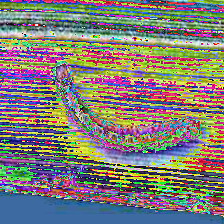

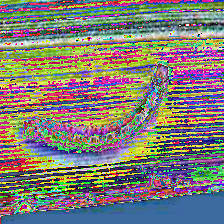

In [31]:
for i in range(5):
  sample = train_ds[6][0]
  display_tensor(sample)

Notes:


*   The colors of the image are distorted since we applied normalization on it in order to make training faster.
*   The image is randomly rotated horizontally with a 50% probabilty of rotation for data augmentation purposes


## 4.4 - Definition of Data Loaders

In [32]:
#With Balancing
#train_loader = DataLoader(train_ds, batch_size=32, sampler=train_sampler, num_workers=4)
#val_loader = DataLoader(val_ds, batch_size=32, sampler=val_sampler, num_workers=4)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=True, num_workers=4)

dataloaders = {"train": train_loader, "val": val_loader}


### 4.4.1 - Checking data distribution after balancing

In [33]:
#Uncomment if balancing is applied
#plot_distrib_in_n_batches(32)

# 5 - Training

## 5.1 - Training parameters

In [34]:
if torch.cuda.is_available():
    use_gpu = True
    print("Using GPU")
else:
    use_gpu = False
FloatTensor = torch.cuda.FloatTensor if use_gpu else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_gpu else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_gpu else torch.ByteTensor
Tensor = FloatTensor

Using GPU


In [35]:
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-d93e6d2b-47bc-f159-8fc7-66c348a207f6)


In [36]:
model = models.resnet152(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/hub/checkpoints/resnet152-b121ed2d.pth


In [37]:
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 120)

if torch.cuda.device_count() > 1 and multiGPU:
  print("Using", torch.cuda.device_count(), "GPUs!")
  model = nn.DataParallel(model)

if use_gpu:
   model.cuda()

criterion = nn.CrossEntropyLoss()

optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

epochs=5

## 5.2 - Train model

  0%|          | 0/1410 [00:00<?, ?it/s]

Epoch 0/4
----------


  0%|          | 0/235 [00:00<?, ?it/s]

train Loss: 0.0704 Acc: 0.4654 in 10m 6s


  0%|          | 0/1410 [00:00<?, ?it/s]

val Loss: 0.0475 Acc: 0.5888 in 1m 3s
Epoch 1/4
----------


  0%|          | 0/235 [00:00<?, ?it/s]

train Loss: 0.0417 Acc: 0.6371 in 10m 5s


  0%|          | 0/1410 [00:00<?, ?it/s]

val Loss: 0.0400 Acc: 0.6454 in 1m 1s
Epoch 2/4
----------


  0%|          | 0/235 [00:00<?, ?it/s]

train Loss: 0.0320 Acc: 0.7125 in 10m 10s


  0%|          | 0/1410 [00:00<?, ?it/s]

val Loss: 0.0372 Acc: 0.6654 in 1m 2s
Epoch 3/4
----------


  0%|          | 0/235 [00:00<?, ?it/s]

train Loss: 0.0255 Acc: 0.7618 in 10m 9s


  0%|          | 0/1410 [00:00<?, ?it/s]

val Loss: 0.0370 Acc: 0.6773 in 1m 2s
Epoch 4/4
----------


  0%|          | 0/235 [00:00<?, ?it/s]

train Loss: 0.0204 Acc: 0.8060 in 10m 6s


100%|██████████| 235/235 [01:01<00:00,  3.79it/s]


val Loss: 0.0373 Acc: 0.6818 in 1m 2s
Training complete in 55m 46s
Best val Acc: 0.681806


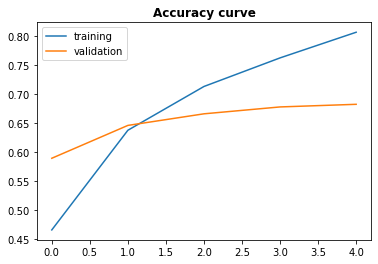

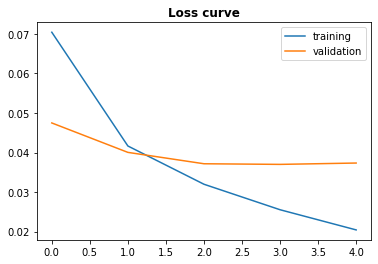

In [38]:
model = train_model(model, criterion, optimizer_ft, num_epochs=epochs)

In [39]:
# torch.save(model,"/content/saved_model")

In [40]:
#Kaggle
#model = torch.load('/kaggle/input/trainedmodel/model')

In [41]:
# Colab
model2 = torch.load('../input/resnext-101/model.pt')

In [42]:
val_loader = DataLoader(val_ds, batch_size=1, num_workers=2)

In [43]:
show_combined_val_accuracy(model,model2)

100%|██████████| 7508/7508 [08:21<00:00, 14.98it/s]

0.7260255727224294


# 6 - Testing

## 6.1 - Test model

In [44]:
sub_df = pd.read_csv(SAMPLE_SUB_PATH)
sub_df.columns = ["id", "target"]
sub_df

,id,target
0,00000.jpg,0
1,00001.jpg,0
2,00004.jpg,0
3,00007.jpg,0
4,00010.jpg,0
...,...,...
22614,75200.jpg,0
22615,75213.jpg,0
22616,75215.jpg,0
22617,75218.jpg,0


In [45]:
sub_ds = InsectDataset(TEST_IMG_PATH, sub_df, simple_transform)

sub_loader = DataLoader(sub_ds, batch_size=32,
                        shuffle=False, num_workers=4)

In [46]:
preds = test_model(model,model2)

707it [04:33,  2.58it/s]

Run complete in 4m 34s


In [47]:
print(preds.argmax(1))

[  4  59 101 ...   8  38  51]


## 6.2 - Test set distribution

In [48]:
distrib_df = sub_df.copy()
distrib_df = distrib_df.drop(['target'], axis=1)
distrib_df['target'] = preds.argmax(1)
distrib_df.head()

,id,target
0,00000.jpg,4
1,00001.jpg,59
2,00004.jpg,101
3,00007.jpg,28
4,00010.jpg,101


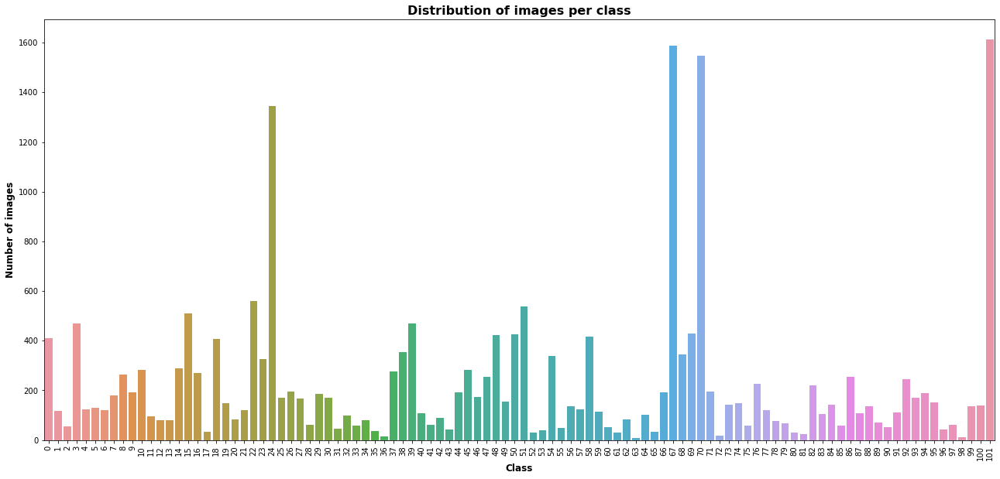

In [49]:
plot_image_distribution(distrib_df)

## 6.3 - Confusion matrix

235it [00:59,  3.93it/s]


Run complete in 0m 60s


[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9'),
 Text(0, 10.5, '10'),
 Text(0, 11.5, '11'),
 Text(0, 12.5, '12'),
 Text(0, 13.5, '13'),
 Text(0, 14.5, '14'),
 Text(0, 15.5, '15'),
 Text(0, 16.5, '16'),
 Text(0, 17.5, '17'),
 Text(0, 18.5, '18'),
 Text(0, 19.5, '19'),
 Text(0, 20.5, '20'),
 Text(0, 21.5, '21'),
 Text(0, 22.5, '22'),
 Text(0, 23.5, '23'),
 Text(0, 24.5, '24'),
 Text(0, 25.5, '25'),
 Text(0, 26.5, '26'),
 Text(0, 27.5, '27'),
 Text(0, 28.5, '28'),
 Text(0, 29.5, '29'),
 Text(0, 30.5, '30'),
 Text(0, 31.5, '31'),
 Text(0, 32.5, '32'),
 Text(0, 33.5, '33'),
 Text(0, 34.5, '34'),
 Text(0, 35.5, '35'),
 Text(0, 36.5, '36'),
 Text(0, 37.5, '37'),
 Text(0, 38.5, '38'),
 Text(0, 39.5, '39'),
 Text(0, 40.5, '40'),
 Text(0, 41.5, '41'),
 Text(0, 42.5, '42'),
 Text(0, 43.5, '43'),
 Text(0, 44.5, '44'),
 Text(0, 45.5, '45'),
 Text(0,

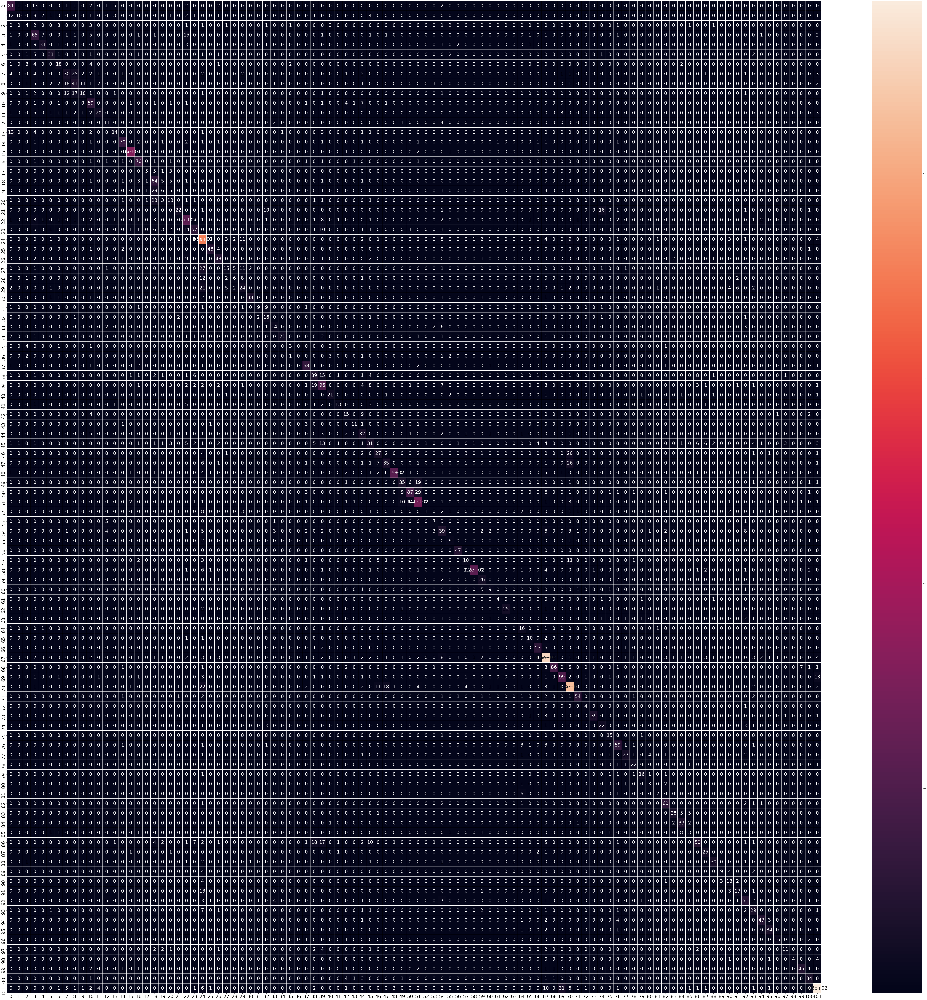

In [50]:
val_ds = InsectDataset(TRAIN_IMG_PATH, val_df, simple_transform)
eval_loader = DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=4)
cf_matrix = get_confusion_matrix(model, eval_loader)

f,ax = plt.subplots(figsize=(115,115))
res = sns.heatmap(cf_matrix, annot=True, annot_kws={"size":30}, linewidths=0.8, ax=ax)
res.set_xticklabels(res.get_xmajorticklabels(), fontsize=30)
res.set_yticklabels(res.get_xmajorticklabels(), fontsize=30)

# 7 - Submission

In [51]:
output_df = sub_df.copy()
output_df['class'] = preds.argmax(1)
output_df = output_df.drop(['target'], axis=1)
output_df = output_df.rename({'id':'name'}, axis=1)
output_df.head()

,name,class
0,00000.jpg,4
1,00001.jpg,59
2,00004.jpg,101
3,00007.jpg,28
4,00010.jpg,101


In [52]:
output_df.to_csv("submission.csv", index=False)